# SenseBoard_Report

This notebook generates **visual diagnostic reports** for runs involving the **SenseBoard**.  
It loads telemetry from `all_data_enriched.csv`, interval definitions from `summary.json`, and for each run where SenseBoard is present, it plots a **multi-panel figure** comparing SenseBoard signals against Vakaros.

**Inputs**  
- `all_data_enriched.csv`: consolidated telemetry (all runs, all boats)  
- `summary.json`: run intervals with metadata  
- Parameters: `MAX_POINTS` (limit for subsampled plotting)  

**Workflow**  
1. Load data and interval definitions.  
2. For each run:  
   - Select first interval (`interval[0]`).  
   - Skip if SenseBoard not involved.  
   - Extract SenseBoard rows, filter to interval time window.  
   - Downsample to at most `MAX_POINTS`.  
   - Plot report.  

**Plots (2 × 5 grid)**  
- **Row 1**: TWS, TWD, GPS track (Vakaros vs SenseBoard), SOG, COG  
- **Row 2**: Heel (Vakaros `Heel` vs SenseBoard `Euler_X`), Pitch (Vakaros `Trim` vs SenseBoard `Euler_Y`), Front Force, Back Force, (empty)  

**Helper functions**  
- `filter_interval`: select rows between start/end timestamps  
- `format_timestamp`: human-readable interval boundaries  
- `normalize_angle`: wrap angles into `[-180, 180)`  
- `plot_senseboard_report`: builds the multi-panel figure  

**Output**  
- One figure per SenseBoard-involved run, with title including run name, wind side (Upwind/Downwind from avg TWA), opponent name, and interval timestamps.  
- Skips runs without SenseBoard data or empty intervals, printing a notice.  

**Notes**  
- Heel and pitch comparisons overlay Vakaros vs SenseBoard.  
- GPS panel shows both trajectories on longitude/latitude axes.  
- Subsampling ensures responsive plotting for large datasets.  


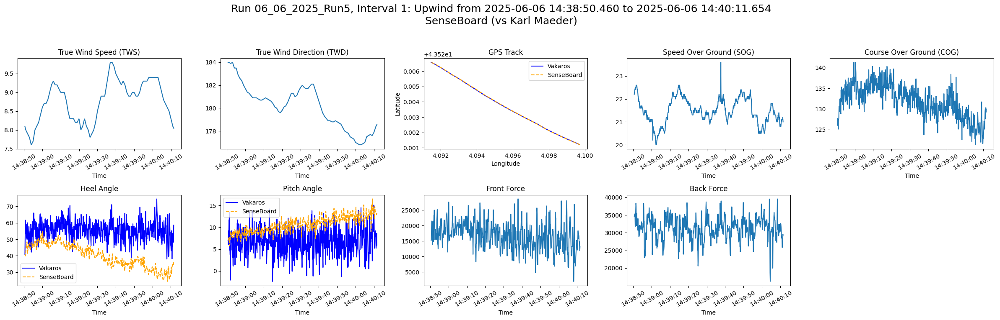

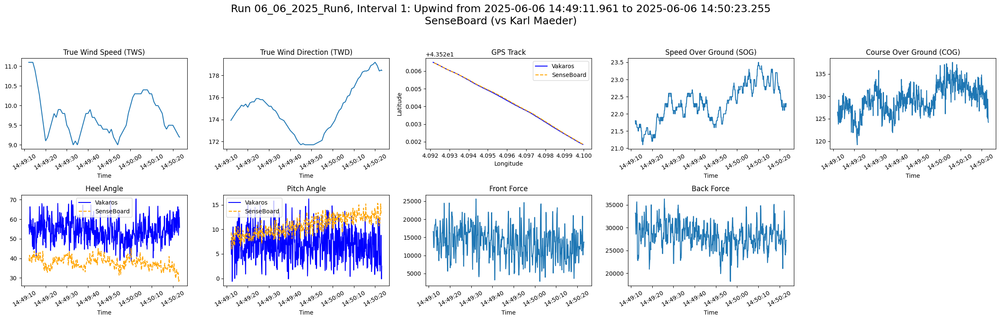

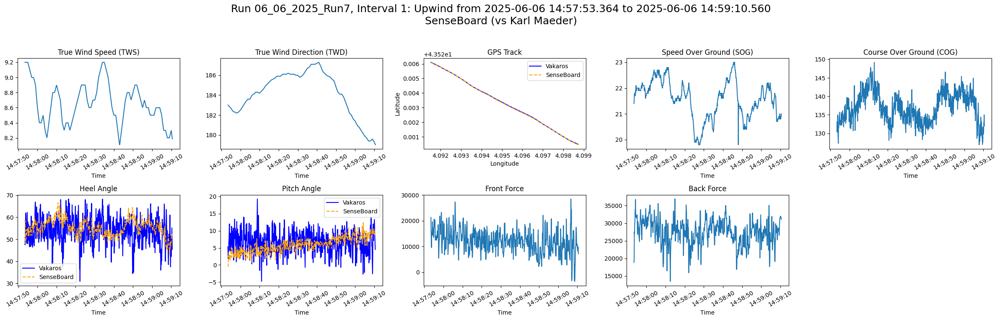

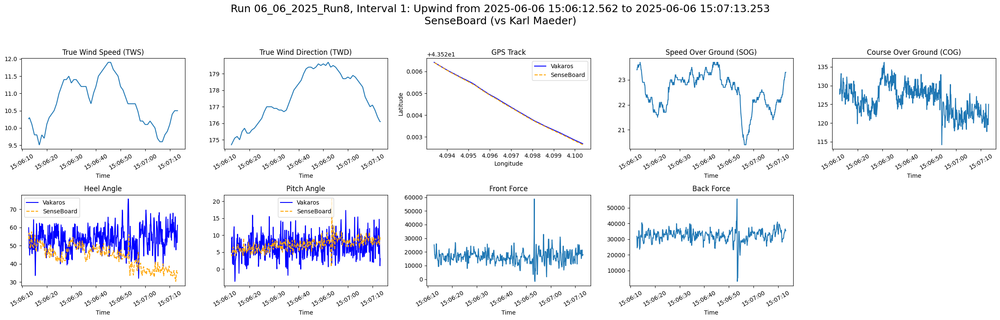

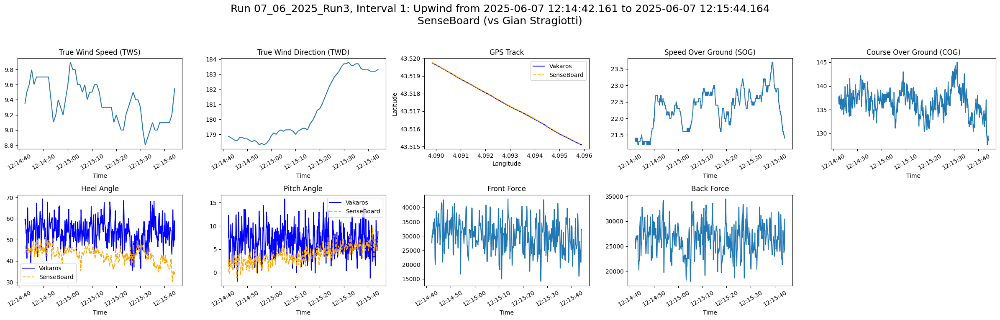

...

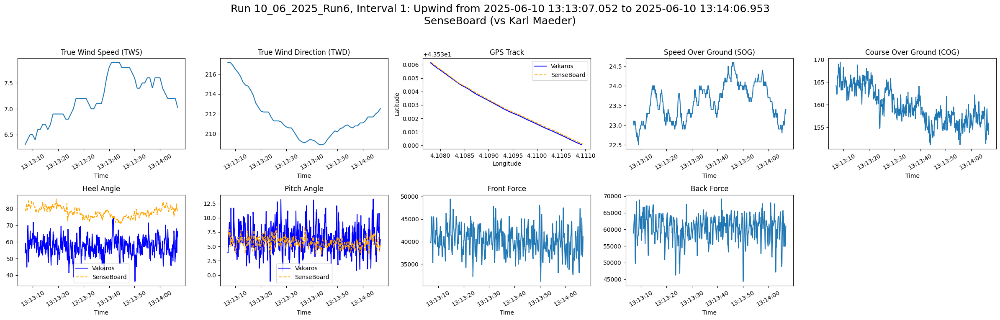

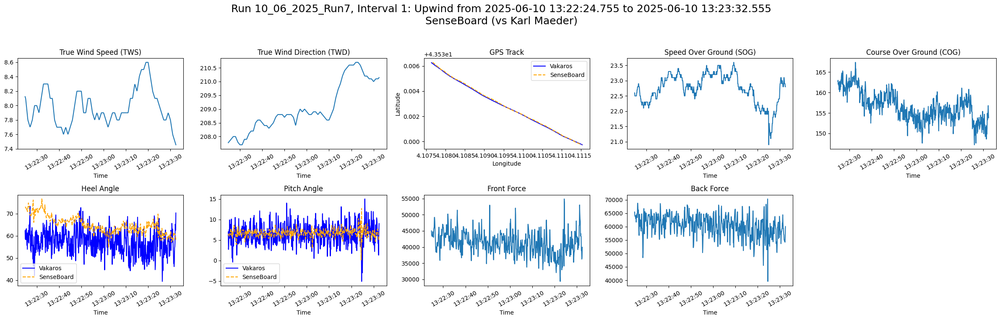

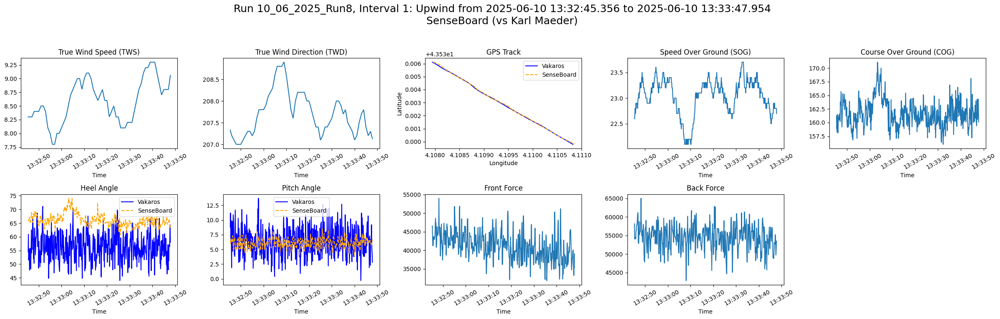

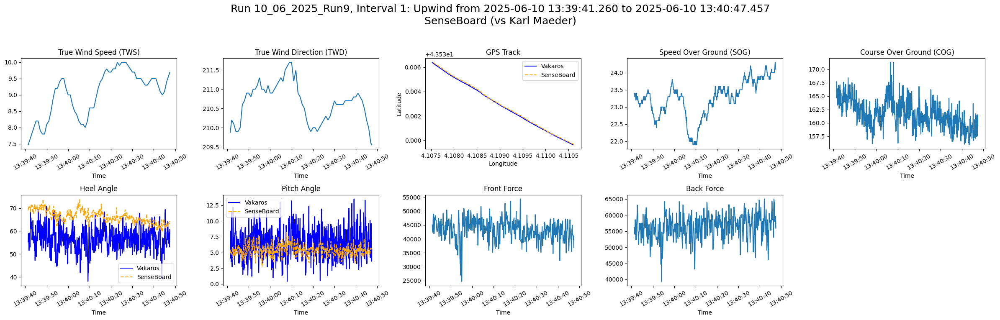

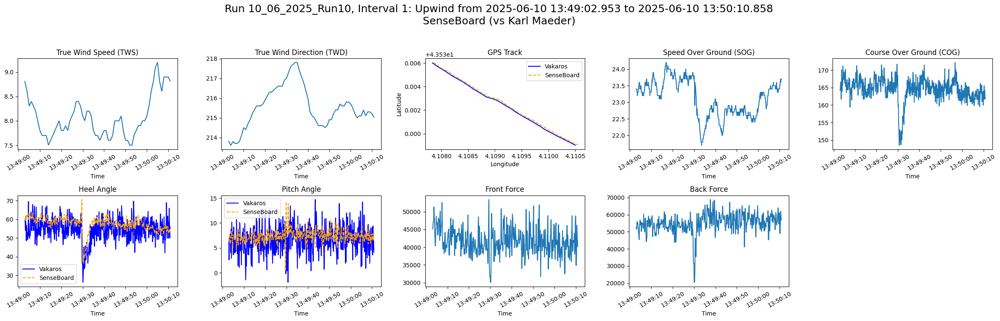

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import json
from datetime import datetime

# === PARAMETERS ===
FICHIER_CSV = "all_data_enriched.csv"
SUMMARY_PATH = "summary.json"
MAX_POINTS = 1000

# === LOAD DATA ===
df = pd.read_csv(FICHIER_CSV, low_memory=False)

# === LOAD SUMMARY ===
with open(SUMMARY_PATH, "r") as f:
    summary = json.load(f)

# === UTILITY ===
def filter_interval(df, start, end):
    return df[(df["SecondsSince1970"] >= start) & (df["SecondsSince1970"] <= end)].reset_index(drop=True)

def format_timestamp(ts):
    return datetime.utcfromtimestamp(ts).strftime("%Y-%m-%d %H:%M:%S.%f")[:-3]

def normalize_angle(angle_series):
    return ((angle_series + 180) % 360) - 180


# === PLOTTING FUNCTION ===
def plot_senseboard_report(run_name, interval, data):
    if len(data) > MAX_POINTS:
        data = data.sample(n=MAX_POINTS).sort_values("ISODateTimeUTC")

    time = pd.to_datetime(data["ISODateTimeUTC"]).dt.tz_localize(None)
    sb_time = pd.to_datetime(data["Timestamp GPS"]).dt.tz_localize(None)

    wind_side = "Upwind" if interval["avg TWA boat2"] > 0 else "Downwind"
    opponent = interval["boat1_name"] if interval["boat2_name"] == "SenseBoard" else interval["boat2_name"]
    start_str = format_timestamp(interval["start_time"])
    end_str = format_timestamp(interval["end_time"])

    fig, axes = plt.subplots(2, 5, figsize=(24, 8))
    fig.suptitle(
        f"Run {run_name}, Interval 1: {wind_side} from {start_str} to {end_str}\n"
        f"SenseBoard (vs {opponent})",
        fontsize=18
    )

    # Row 1
    axes[0, 0].plot(time, data["TWS"])
    axes[0, 0].set_title("True Wind Speed (TWS)")
    axes[0, 1].plot(time, data["TWD"])
    axes[0, 1].set_title("True Wind Direction (TWD)")
    axes[0, 2].plot(data["Lon"], data["Lat"], label="Vakaros", color="blue")
    axes[0, 2].plot(data["Longitude"], data["Latitude"], label="SenseBoard", color="orange", linestyle="--")
    axes[0, 2].set_title("GPS Track")
    axes[0, 2].legend()
    axes[0, 3].plot(time, data["SOG"])
    axes[0, 3].set_title("Speed Over Ground (SOG)")
    axes[0, 4].plot(time, data["COG"])
    axes[0, 4].set_title("Course Over Ground (COG)")

    # Row 2
    axes[1, 0].plot(time, data["Heel"], label="Vakaros", color="blue")
    axes[1, 0].plot(sb_time, normalize_angle(data["Euler_X (deg)"]), label="SenseBoard", color="orange", linestyle="--")

    #axes[1, 0].plot(sb_time, data["Euler_X (deg)"], label="SenseBoard", color="orange", linestyle="--")
    axes[1, 0].set_title("Heel Angle")
    axes[1, 0].legend()
    axes[1, 1].plot(time, data["Trim"], label="Vakaros", color="blue")
    axes[1, 1].plot(sb_time, data["Euler_Y (deg)"], label="SenseBoard", color="orange", linestyle="--")
    axes[1, 1].set_title("Pitch Angle")
    axes[1, 1].legend()
    axes[1, 2].plot(time, data["F_front"])
    axes[1, 2].set_title("Front Force")
    axes[1, 3].plot(time, data["F_back"])
    axes[1, 3].set_title("Back Force")
    axes[1, 4].axis("off")

    # Set x-labels and rotation only for relevant plots
    for i in [(0, 0), (0, 1), (0, 3), (0, 4), (1, 0), (1, 1), (1, 2), (1, 3)]:
        axes[i].set_xlabel("Time")
        axes[i].tick_params(axis='x', rotation=30)

    # Set proper labels for GPS
    axes[0, 2].set_xlabel("Longitude")
    axes[0, 2].set_ylabel("Latitude")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# === MAIN LOOP ===
for entry in summary:
    run = entry["run"]
    intervals = entry.get("intervals", [])
    if len(intervals) < 1:
        continue

    interval = intervals[0]
    if "SenseBoard" not in [interval["boat1_name"], interval["boat2_name"]]:
        continue
    
    run_df = df[df["run"] == run]
    sb_df = run_df[run_df["boat_name"] == "SenseBoard"]
    if sb_df.empty:
        print(f"[SKIPPED] No SenseBoard data for run {run}")
        continue

    filtered_data = filter_interval(sb_df, interval["start_time"], interval["end_time"])
    if filtered_data.empty:
        print(f"[SKIPPED] Empty interval data for run {run}")
        continue

    plot_senseboard_report(run, interval, filtered_data)


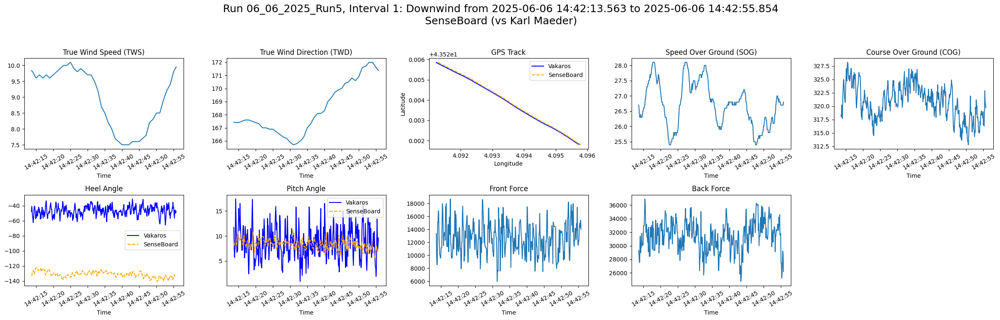

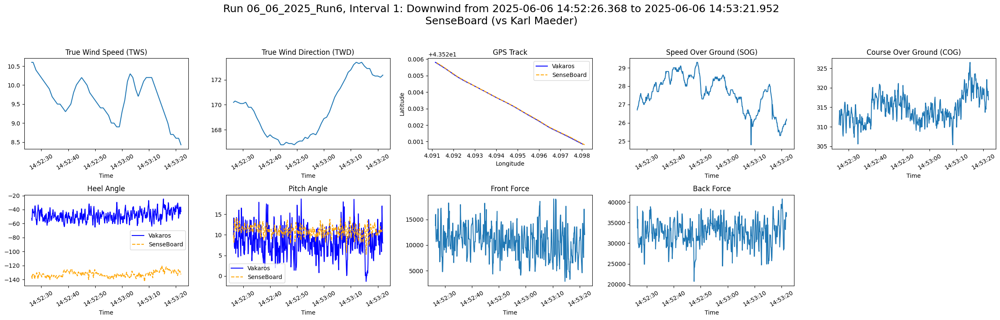

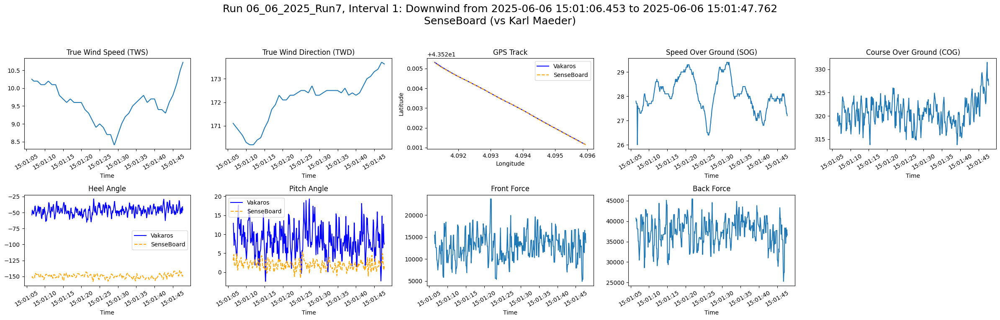

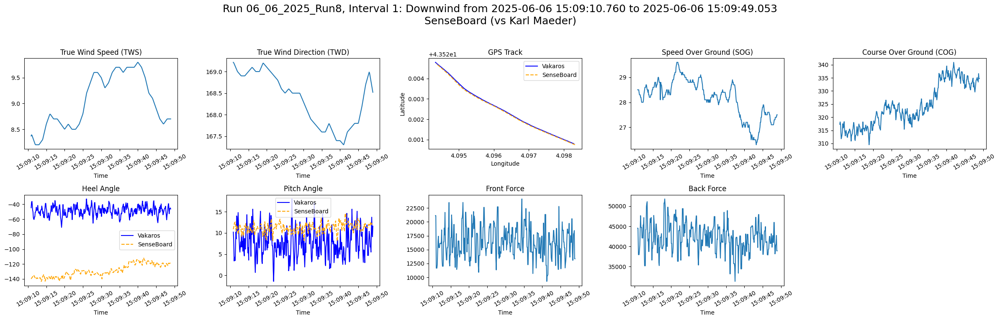

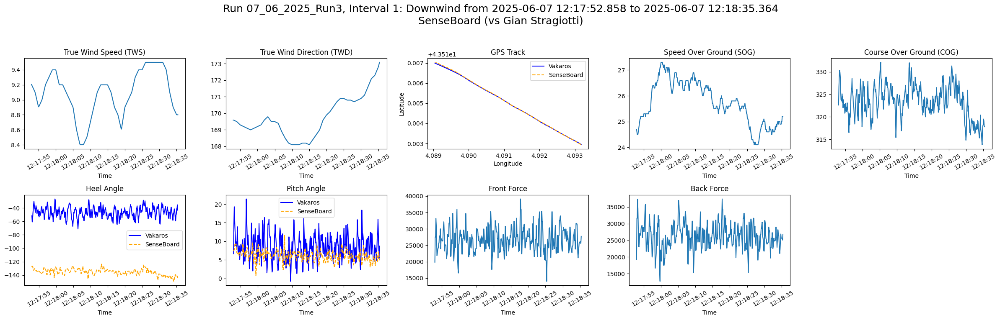

...

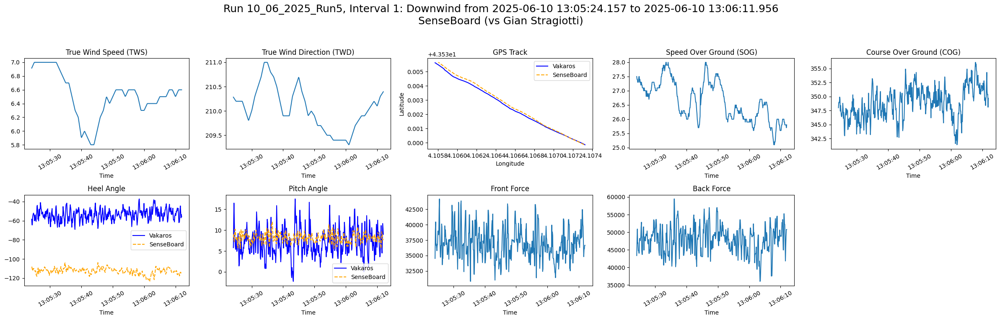

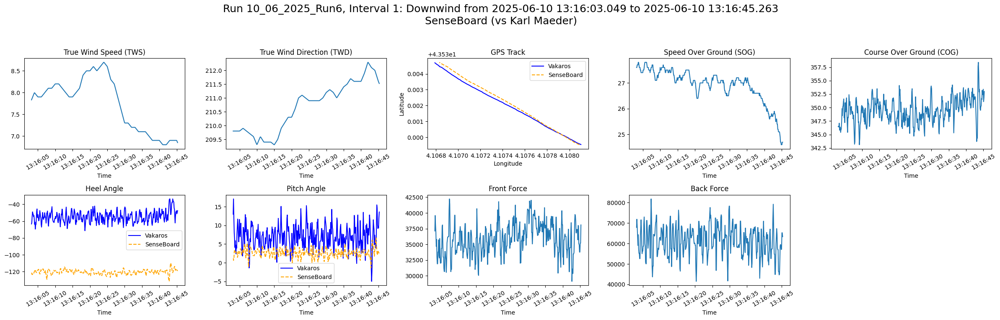

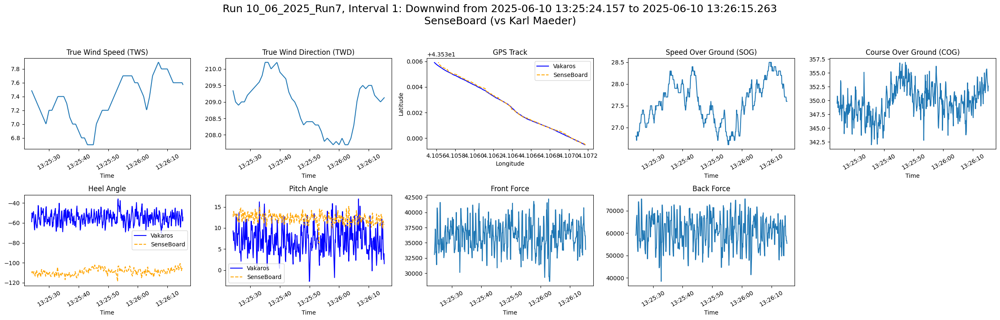

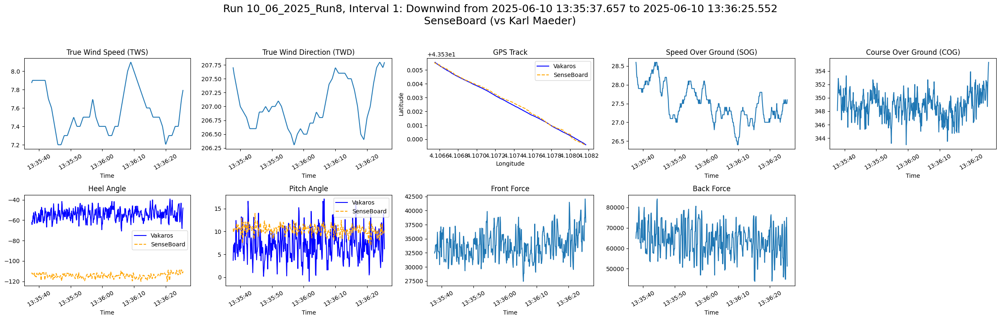

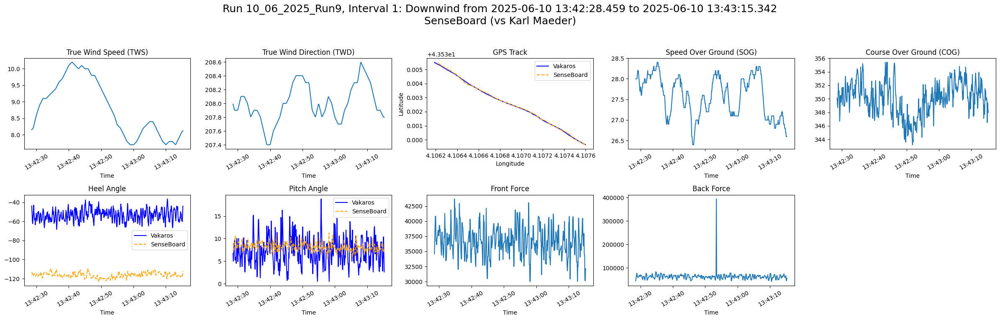

In [2]:
# === DOWNWIND LOOP ===
for entry in summary:
    run = entry["run"]
    intervals = entry.get("intervals", [])
    if len(intervals) < 2:
        continue  # Skip if no downwind interval

    interval = intervals[1]  # Always use second interval (Downwind)
    if interval["boat2_name"] != "SenseBoard":
        continue

    run_df = df[df["run"] == run]
    sb_df = run_df[run_df["boat_name"] == "SenseBoard"]
    if sb_df.empty:
        print(f"[SKIPPED] No SenseBoard data for run {run}")
        continue

    filtered_data = filter_interval(sb_df, interval["start_time"], interval["end_time"])
    if filtered_data.empty:
        print(f"[SKIPPED] Empty interval data for run {run}")
        continue

    plot_senseboard_report(run, interval, filtered_data)
